## Imports and Data

In [9]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from matplotlib import colormaps as cm
import seaborn as sb
import scanpy as sc
import umap as up
import scipy.stats
from scib import metrics
import os

In [10]:
import warnings
warnings.filterwarnings("ignore")

In [11]:
sc.set_figure_params(figsize=(7,7),dpi=90)

In [47]:
sb.set_palette("pastel")

In [12]:
adata= sc.read_h5ad("Data\\clean_data_full.h5ad")

## Basic Preprocessing

In [13]:
sc.pp.neighbors(adata,30,use_rep="X")

In [14]:
adata

AnnData object with n_obs × n_vars = 560 × 47269
    obs: 'CCLE_ID', 'Name', 'Pathology', 'Site_Primary', 'Site_Subtype1', 'Site_Subtype2', 'Histology', 'Hist_Subtype1', 'Hist_Subtype2', 'Gender', 'Age', 'Race', 'inferred_ethnicity', 'Site_Of_Finding', 'Disease', 'Original.Source.of.Cell.Line', 'Characteristics', 'Growth.Medium', 'Freezing.Medium', 'Doubling.Time.from.Vendor', 'Doubling.Time.Calculated.hrs', 'type', 'type_refined', 'PATHOLOGIST_ANNOTATION', 'mutRate', 'tcga_code', 'adherent_or_suspension'
    var: 'n_cells', 'DeepCDR_Oncogene', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_rank', 'variances', 'variances_norm'
    uns: 'hvg', 'neighbors'
    obsp: 'distances', 'connectivities'

In [15]:
sc.pp.pca(adata,50)

In [16]:
#we cluster leiden for the whole data to check if the embedded and rembedded data fits 
sc.tl.leiden(adata,0.6,key_added="leiden_high_dimensional")

## Test different parameters and evaluate

In [17]:
def reduce_simple(adata,n_neighbors=15,min_dist=0.01,n_components=2,metric='euclidean',hvgs=None):
    if hvgs != None:
        print(f"subsampling to {hvgs} HVGs")
        sc.pp.highly_variable_genes(adata,n_top_genes=hvgs)
        adata = adata[:,adata.var.highly_variable].copy()
    print("calculating neighborhood graph...")
    sc.pp.neighbors(adata,20,use_rep="X")
    sc.tl.leiden(adata,0.6,key_added="leiden_high_dimensional")
    sc.pp.neighbors(adata,n_neighbors,use_rep="X")
    #initialize reducer
    reducer = up.UMAP(n_neighbors=n_neighbors,n_components=n_components, metric=metric,min_dist=min_dist)
    reducer_all = up.UMAP(n_neighbors=n_neighbors, n_components=n_components, metric=metric,min_dist=min_dist)
    #embed
    embedding_all =  reducer_all.fit_transform(adata.X)
    adata.obsm["X_umap_re"]=embedding_all
    print("recalculate leiden on umap")
    sc.pp.neighbors(adata,n_neighbors,use_rep="X_umap_re")
    sc.tl.leiden(adata,0.6,key_added="leiden_umap")
    return adata

In [28]:
def check_category(adata,c,cutoff):
    if c.startswith("leiden"):
        return False
    g = adata.obs.groupby(c).agg({"CCLE_ID":"count"})
    median= np.median(g.values.flatten())
    return median>=cutoff or adata.obs[c].dtype == "float64"

In [19]:
def eval_and_plot(adata_tmp,plot=False):
    sb.set_palette("pastel")
    sb.set(rc={'figure.figsize':(10,7)})
    list_pcr=[]
    for c in adata_tmp.obs.columns:
        if check_category(adata_tmp,c,2): 
            no_na = adata_tmp.obs[c].dropna().index
            pcr_high_dimensional = metrics.pc_regression(adata_tmp[no_na].X,covariate=adata_tmp[no_na].obs[c])
            pcr_umap = metrics.pc_regression(adata_tmp[no_na].obsm["X_umap_re"],covariate=adata_tmp[no_na].obs[c])
            list_pcr.append((c,pcr_high_dimensional,pcr_umap,(len(no_na)/len(adata_tmp.obs))*100))
    PCR_values = pd.DataFrame(list_pcr,columns=["column","pcr_high_dimensional","pcr_umap","%observations"])#make the score a dataframe
    np.round(PCR_values.sort_values("pcr_high_dimensional",ascending=False),4)
    PCR_values = PCR_values.loc[~PCR_values.column.isin(["leiden_high_dimensional","leiden_umap"])]#remove leiden columns as not informative
    PCR_values["delta"] = PCR_values["pcr_umap"] - PCR_values["pcr_high_dimensional"] #calculate change between 
    PCR_values = np.round(PCR_values.sort_values(["delta"],ascending=False),4)
    melted_PCR = pd.melt(PCR_values,id_vars=["column"],value_vars = ["pcr_high_dimensional","pcr_umap"])
    
    if plot:
        #plot 1
        sb.barplot(
            data=melted_PCR,x="column",y="value",hue="variable",palette={"pcr_high_dimensional":sb.color_palette("pastel")[4],"pcr_umap":sb.color_palette("dark")[4]}
        )
        plt.xticks(rotation=90,fontsize=15)
        plt.ylabel("variance explained",fontsize=20)
        plt.xlabel("Annotation column",fontsize=20)
        plt.title("Principal Component Regression: counts vs. UMAP",fontsize=20)
        plt.ylim(0,1)
        plt.show()
        #plot2

        sb.barplot(
            data=PCR_values.sort_values("pcr_high_dimensional",ascending=False),x="column",y="pcr_high_dimensional")
        plt.xticks(rotation=90,fontsize=15)
        plt.ylabel("variance explained",fontsize=20)
        plt.xlabel("Annotation column",fontsize=20)
        plt.title("Principal Component Regression: Variance in the high dimensional embedding",fontsize=20)
        plt.show()
        #plot3

        sb.barplot(
            data=PCR_values,x="column",y="delta")
        plt.xticks(rotation=90,fontsize=15)
        plt.ylabel("delta variance explained",fontsize=20)
        plt.xlabel("Annotation column",fontsize=20)
        plt.title("Changes in explained variance: UMAP vs. high dimensional data",fontsize=20)
        #plt.ylim(0,1)
        plt.show()
    return PCR_values, melted_PCR

## Check parameters clustering

In [29]:
list_columns=[]
for c in adata.obs.columns:
    if check_category(adata,c,2):
        list_columns.append(c)

In [30]:
list_columns

['Pathology',
 'Site_Primary',
 'Site_Subtype1',
 'Histology',
 'Hist_Subtype1',
 'Hist_Subtype2',
 'Gender',
 'Age',
 'Race',
 'inferred_ethnicity',
 'Site_Of_Finding',
 'Original.Source.of.Cell.Line',
 'Freezing.Medium',
 'Doubling.Time.Calculated.hrs',
 'type',
 'type_refined',
 'PATHOLOGIST_ANNOTATION',
 'mutRate',
 'tcga_code',
 'adherent_or_suspension']

### Load results of random combinations

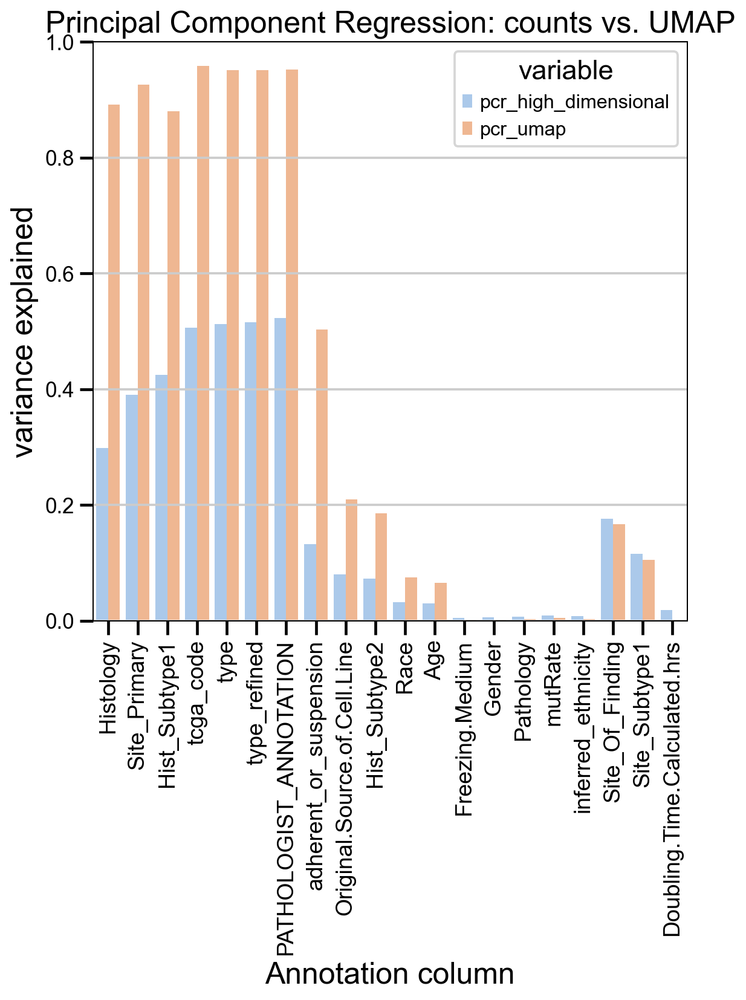

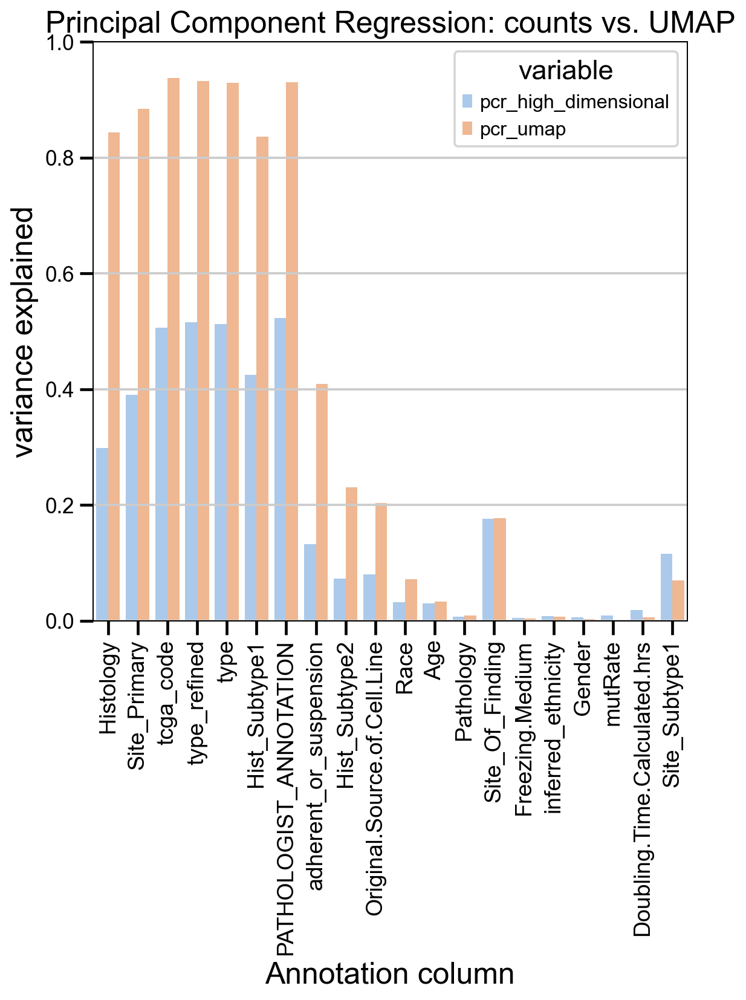

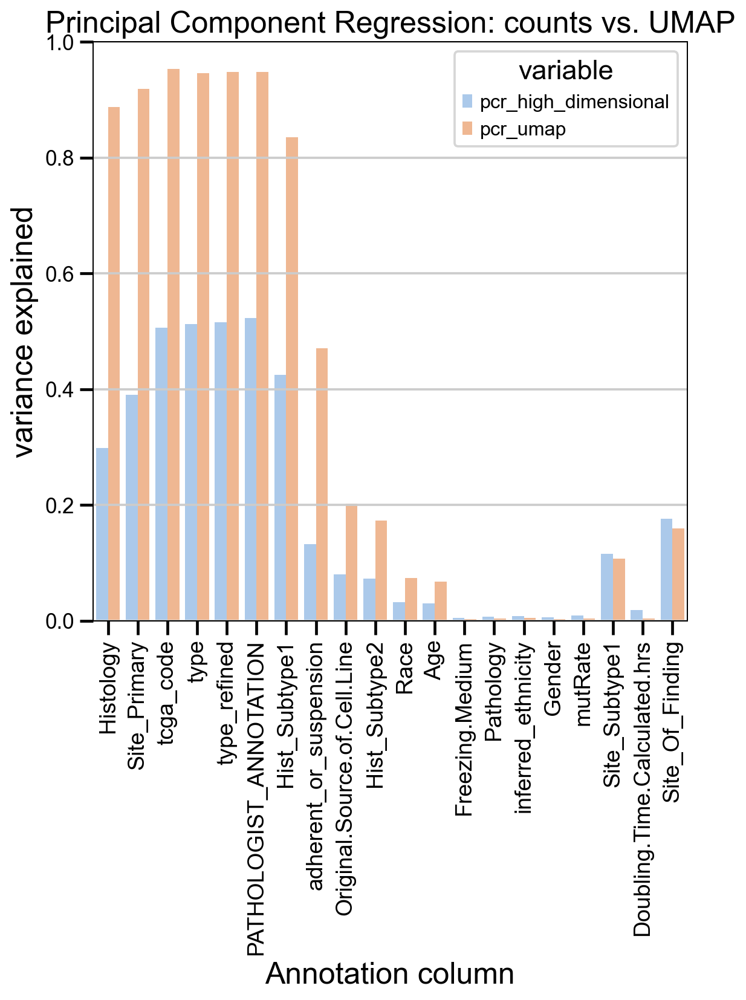

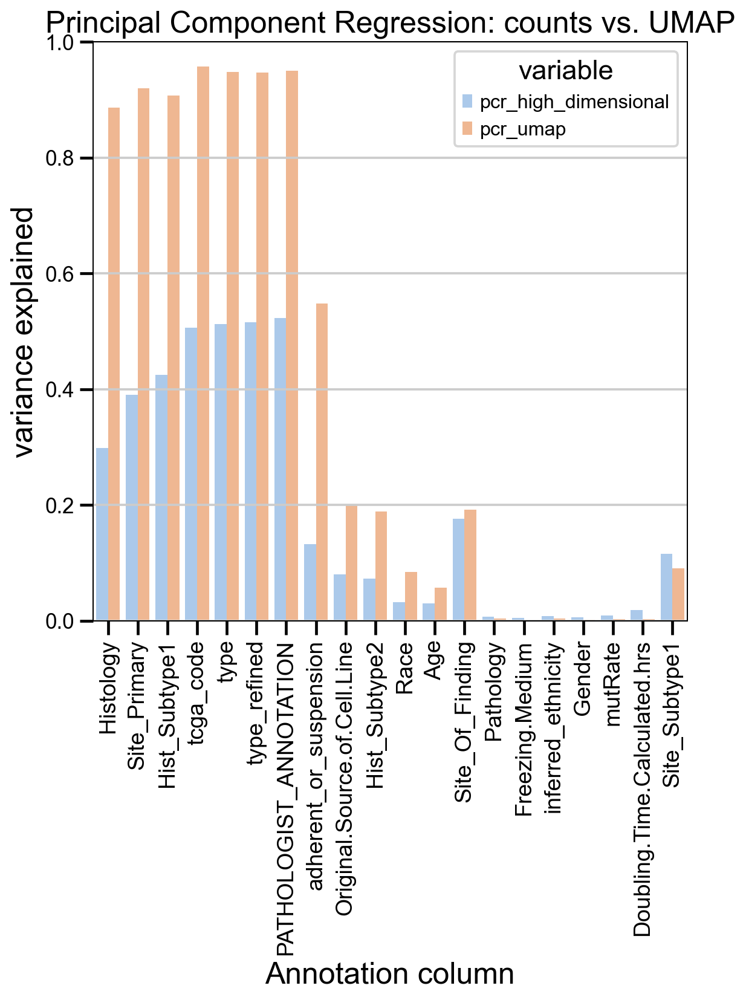

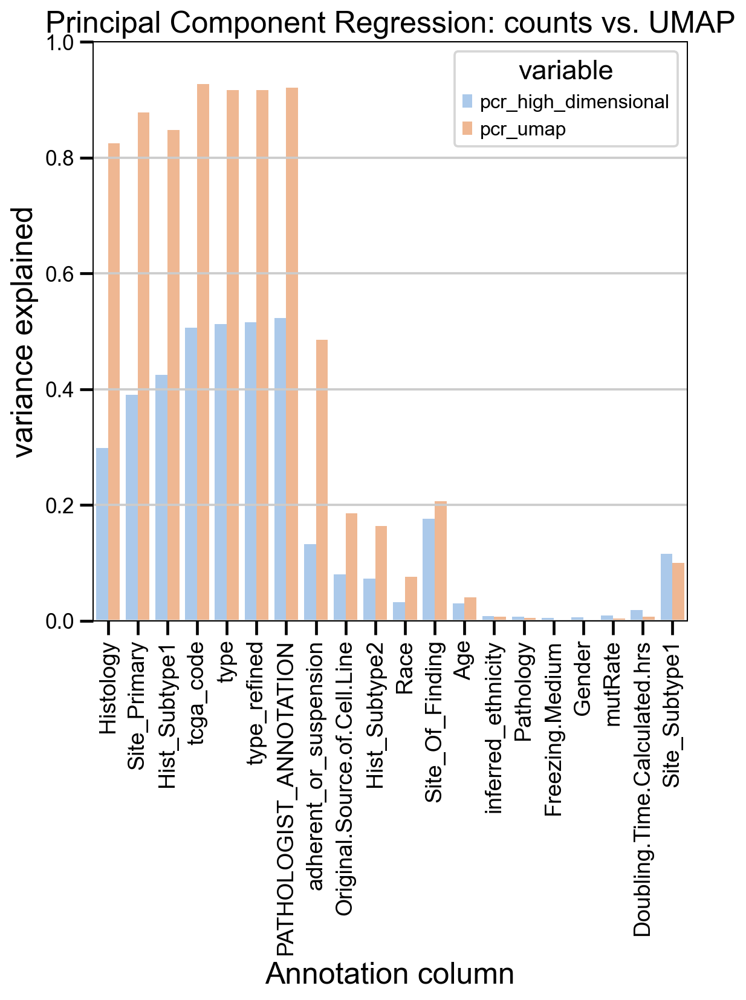

...

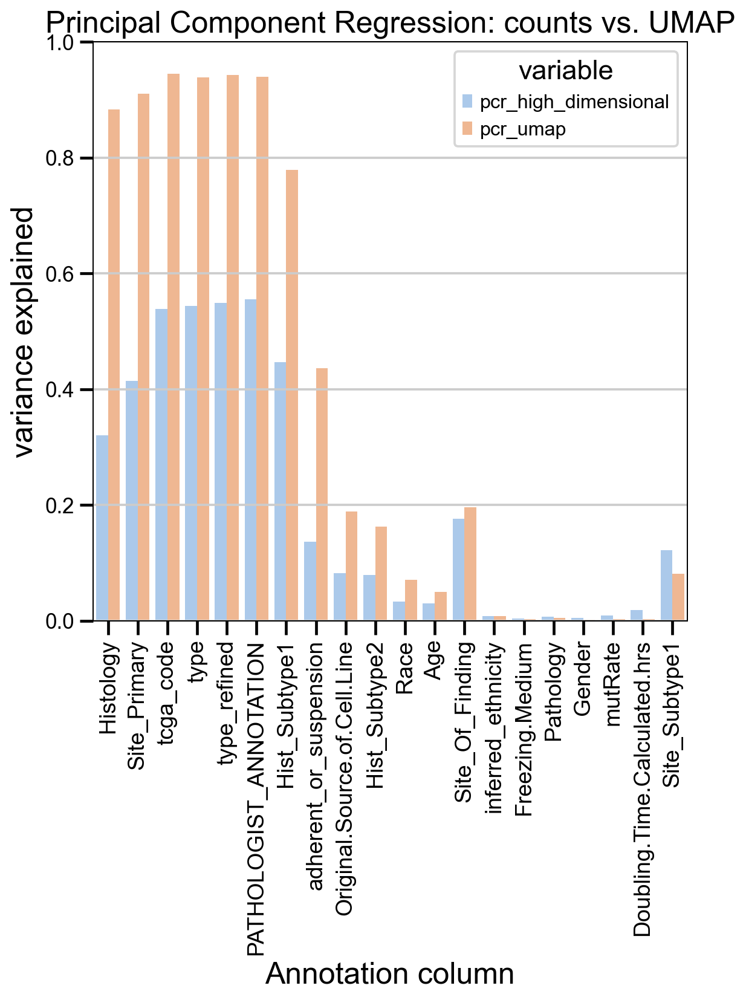

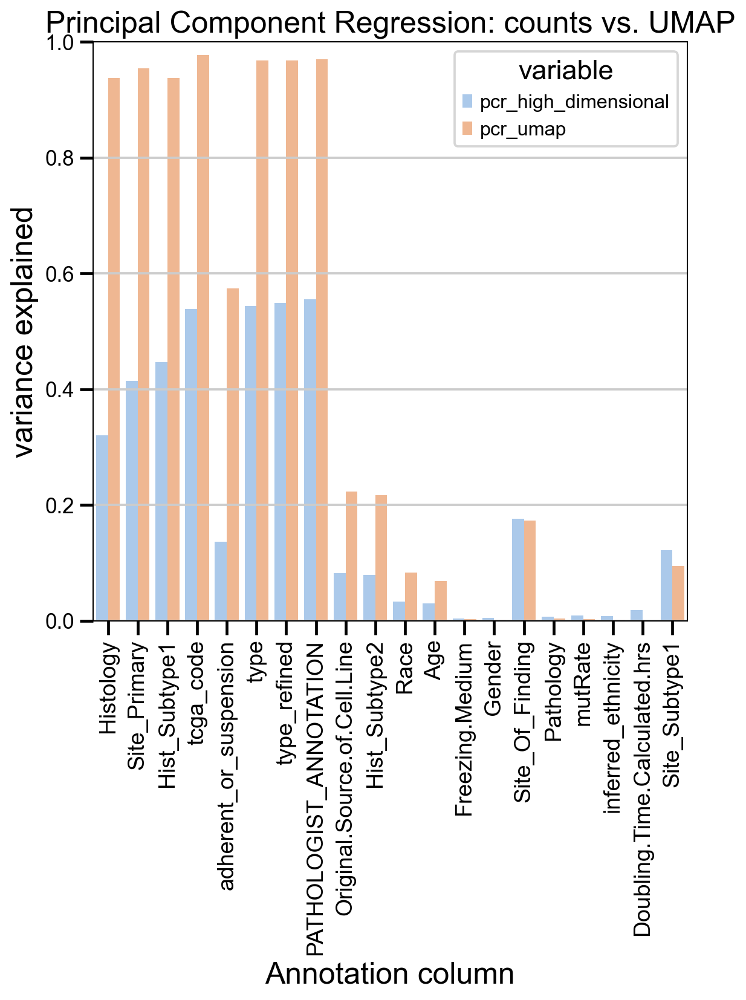

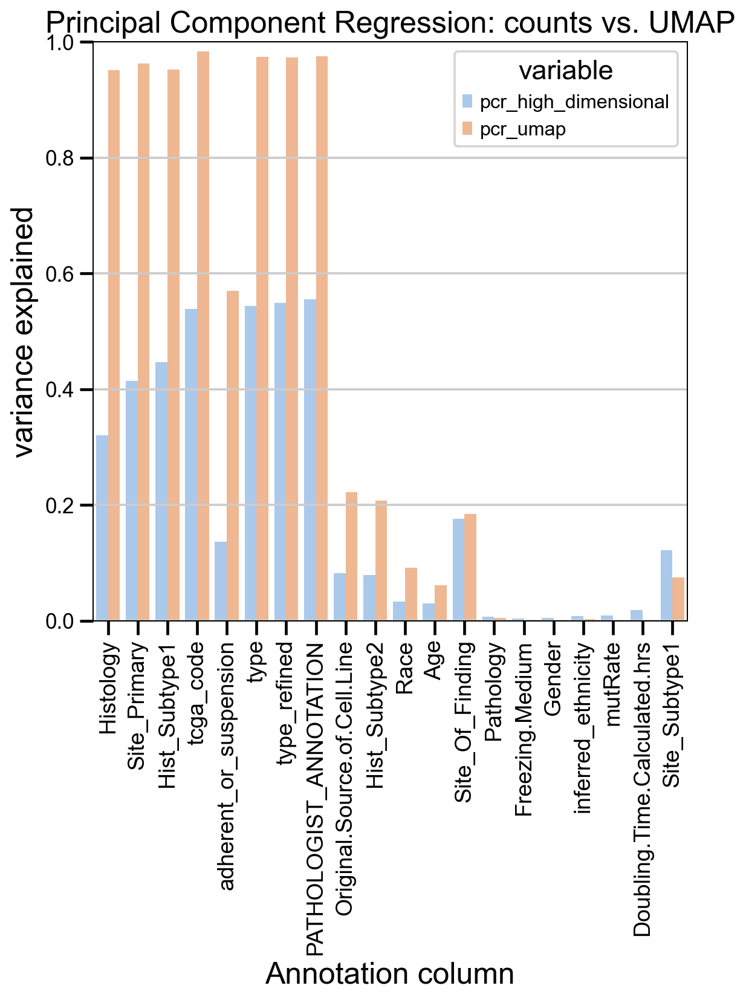

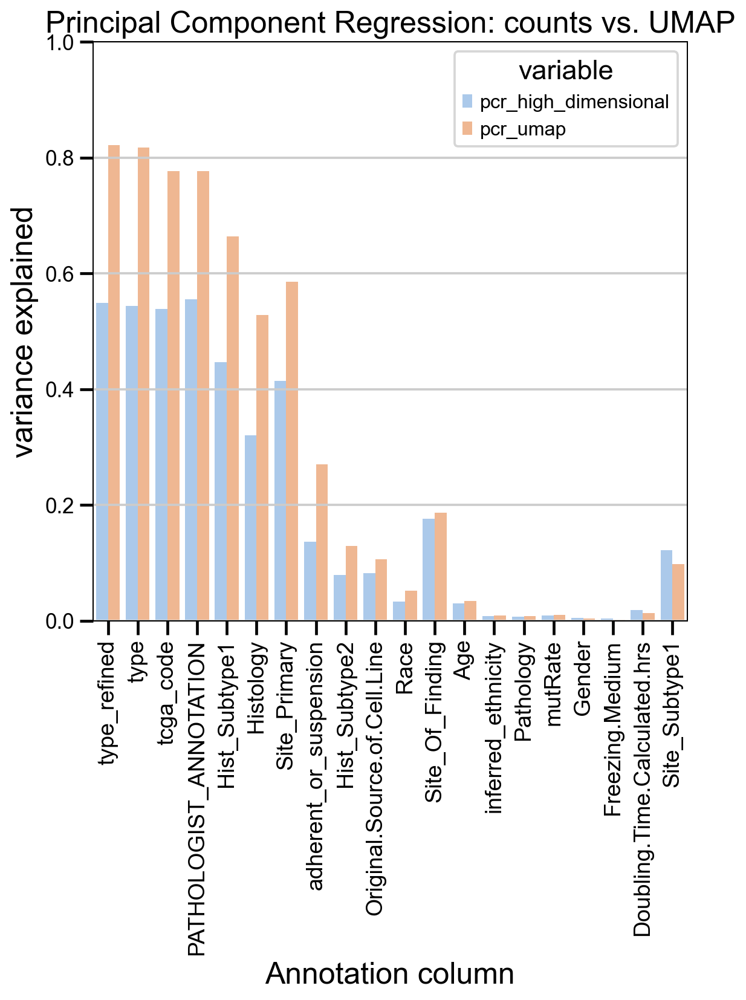

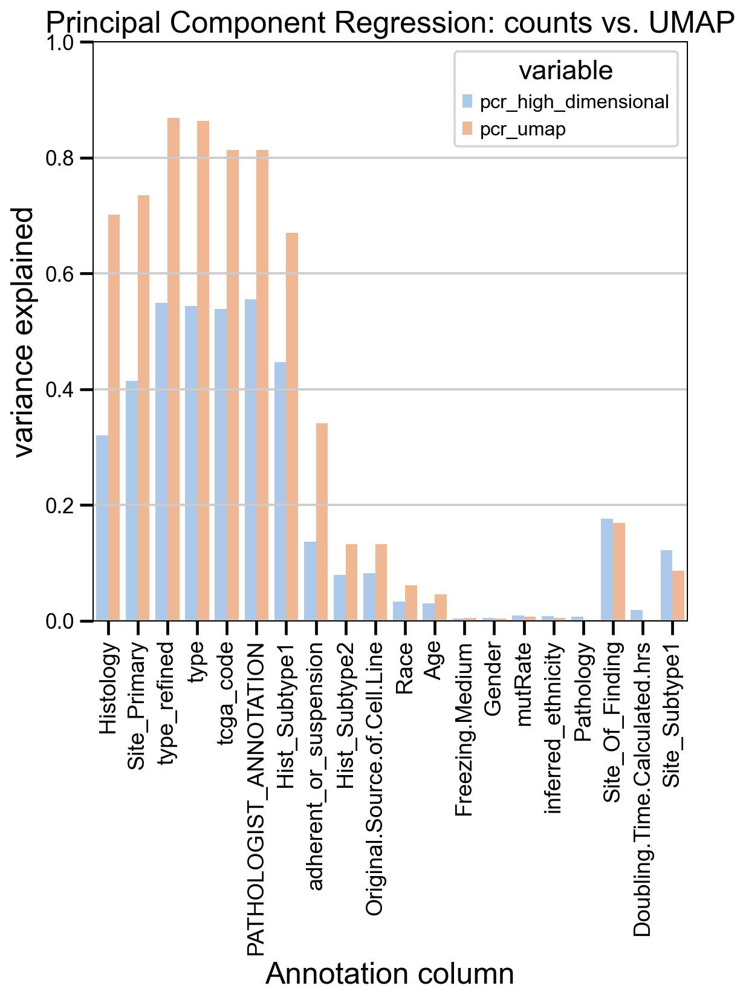

In [141]:
# assign directory
directory = 'tryouts' #where the results of the random paramteter combinations are stored
 
# iterate over files in
# that directory
values=[]
params=[]
stack_values=[]
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        PCR_values= pd.read_csv(f,index_col="column")
        #we will need that later
        value = PCR_values.loc[list_columns].delta.values
        param = f.strip(".csv").strip("tryouts\\").split("_")
        values.append(value)
        params.append(param)
        PCR_values["hvgs"]=param[0]
        PCR_values["components"]=int(param[1])
        PCR_values["nhood_size"]=int(param[2])
        stack_values.append(PCR_values)
        #plot
        melted_values = pd.melt(PCR_values.reset_index(drop=False),id_vars=["column"],value_vars = ["pcr_high_dimensional","pcr_umap"])
        sb.barplot(data=melted_values,x="column", y="value", hue="variable")
        plt.xticks(rotation=90,fontsize=15)
        plt.ylabel("variance explained",fontsize=20)
        plt.xlabel("Annotation column",fontsize=20)
        plt.title("Principal Component Regression: counts vs. UMAP",fontsize=20)
        plt.ylim(0,1)
        plt.show()

### store results of random combinations in an anndata object

In [57]:
values = np.asarray(values)

In [58]:
values.shape

(71, 20)

In [59]:
params = pd.DataFrame(params,columns=["hvgs","neighbors","components"])

In [60]:
params

,hvgs,neighbors,components
0,10000,10,10
1,10000,10,2
2,10000,10,30
3,10000,200,100
4,10000,200,50
...,...,...,...
66,None,15,100
67,None,50,2
68,None,50,30
69,None,5,100


In [61]:
params.components.astype("category").cat.categories

Index(['10', '100', '2', '30', '50', '7'], dtype='object')

In [62]:
var = pd.DataFrame(index = list_columns)

In [63]:
parameters = sc.AnnData(X=np.asarray(values),obs=params,var=var)

In [84]:
parameters

AnnData object with n_obs × n_vars = 71 × 20
    obs: 'hvgs', 'neighbors', 'components', 'leiden'
    uns: 'neighbors', 'leiden', 'umap', 'neighbors_colors', 'leiden_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [85]:
parameters.X

array([[-0.0038,  0.5365, -0.01  , ..., -0.0046,  0.4521,  0.3707],
       [ 0.0017,  0.494 , -0.0458, ..., -0.0079,  0.4315,  0.277 ],
       [-0.0032,  0.5292, -0.0083, ..., -0.0047,  0.4466,  0.3384],
       ...,
       [-0.0023,  0.5482, -0.0466, ..., -0.0081,  0.4455,  0.4335],
       [ 0.0007,  0.1708, -0.0235, ...,  0.0006,  0.2388,  0.1337],
       [-0.0068,  0.3201, -0.0359, ..., -0.0023,  0.2749,  0.2046]])

In [106]:
### cluster the parameters and select at random

In [98]:
sc.pp.neighbors(parameters,6)

In [99]:
sc.tl.leiden(parameters,0.7)

In [100]:
sc.tl.umap(parameters)

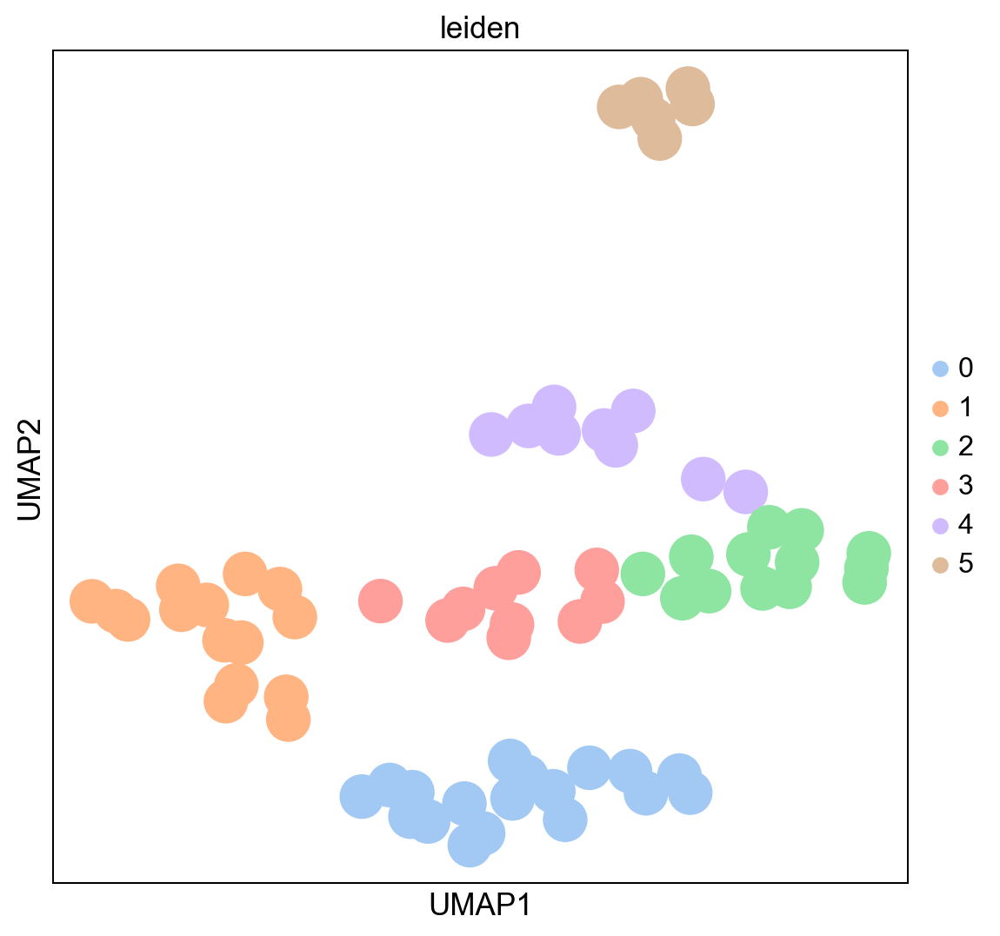

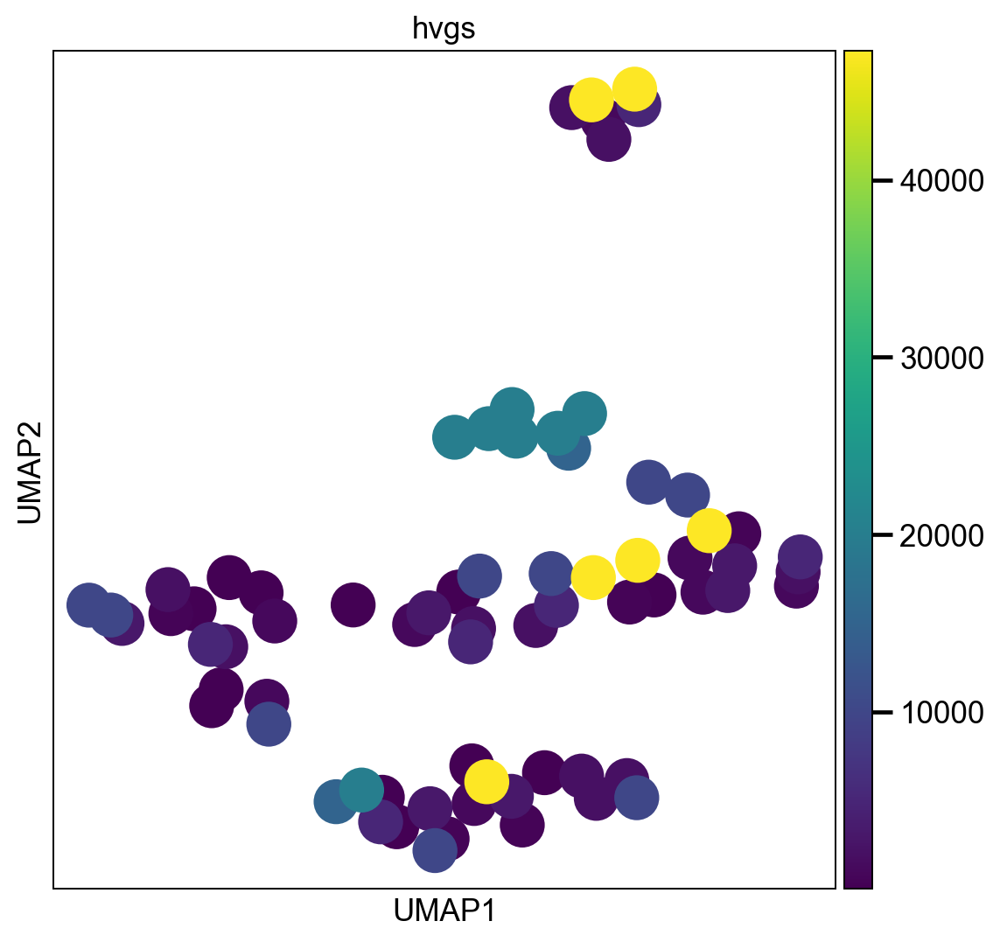

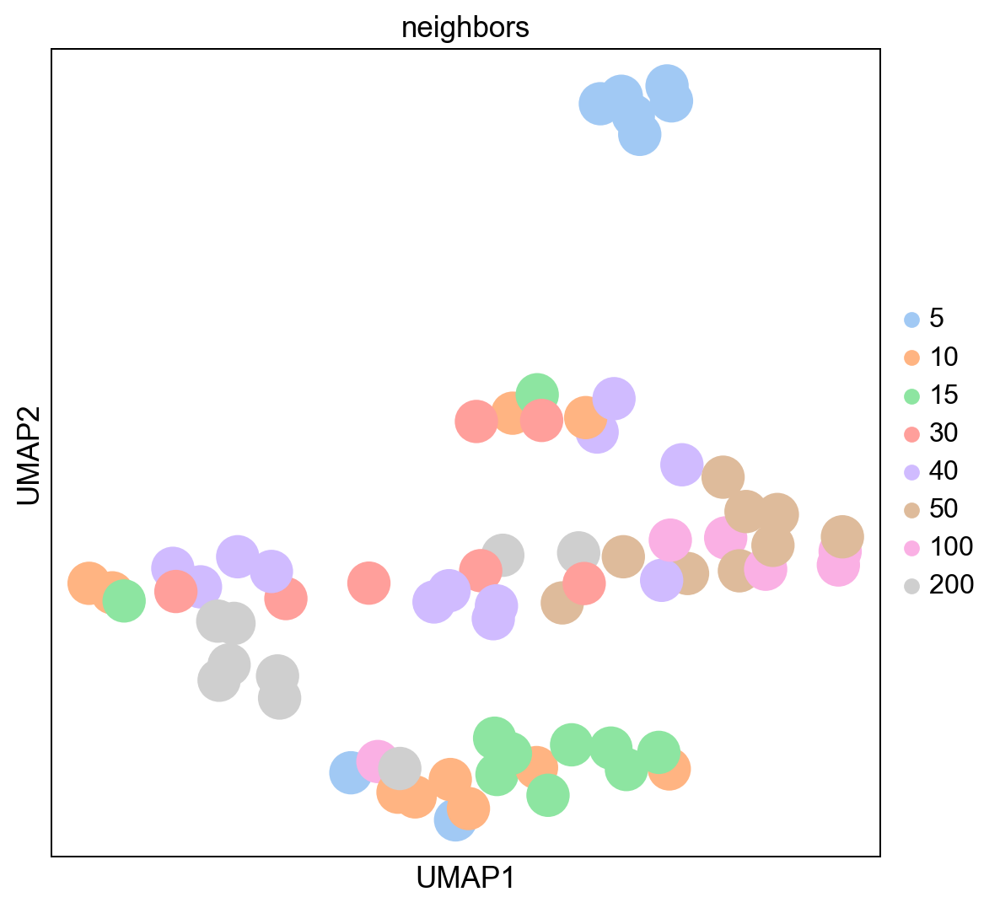

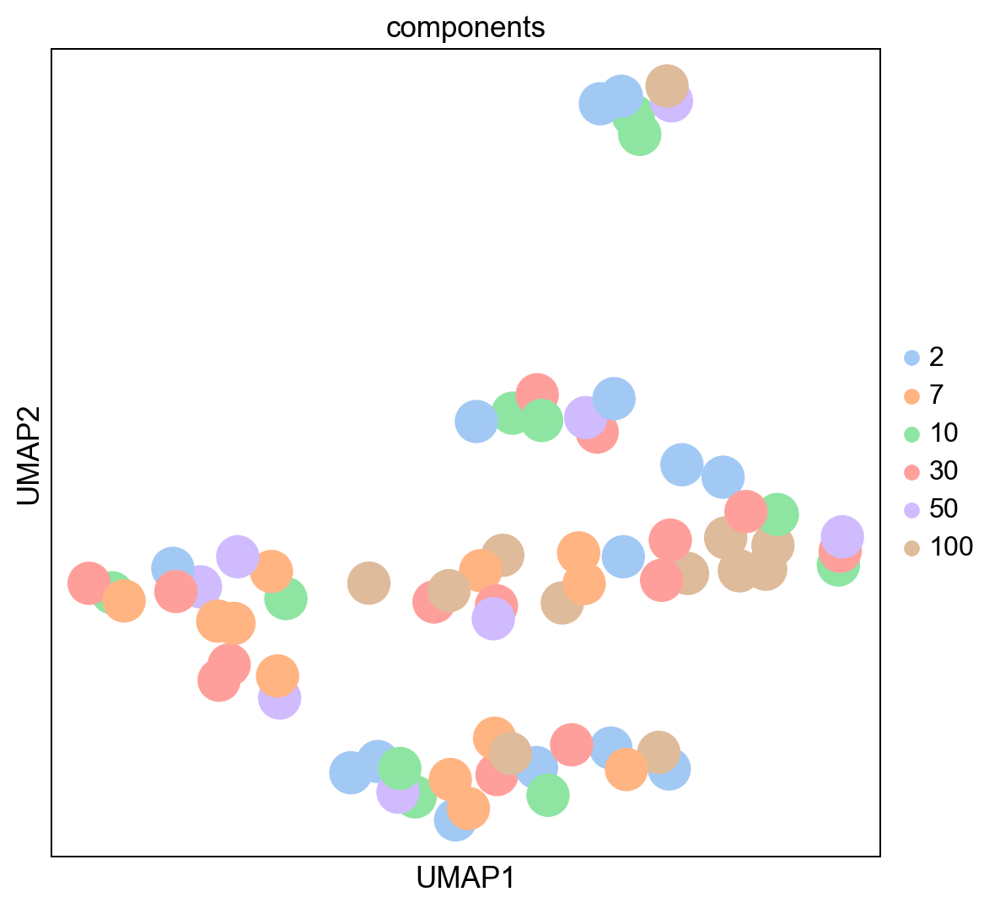

In [185]:
sc.pl.umap(parameters,color="leiden")
sc.pl.umap(parameters,color="hvgs")

sc.pl.umap(parameters,color="neighbors")

sc.pl.umap(parameters,color="components")

In [102]:
parameters.obs.hvgs = parameters.obs.hvgs.astype(str)

In [103]:
parameters.obs.loc[parameters.obs.hvgs =="None","hvgs"]= len(adata.var)

In [104]:
parameters.obs.hvgs = parameters.obs.hvgs.astype("float64")

In [110]:
sampled=[]
for i in range(6):
    sampled.append(parameters[parameters.obs["leiden"]==str(i)].obs.sample(1))

In [111]:
sampled

[      hvgs neighbors components leiden
 36  2000.0        15          2      0,
     hvgs neighbors components leiden
 64  50.0        40         50      1,
        hvgs neighbors components leiden
 67  47269.0        50          2      2,
       hvgs neighbors components leiden
 5  10000.0       200          7      3,
        hvgs neighbors components leiden
 25  15000.0        40         30      4,
       hvgs neighbors components leiden
 42  2000.0         5         10      5]

### check which parameter contirbutes to most variance

In [105]:
for c in parameters.obs.columns:
    print(c)
    print(metrics.pc_regression(parameters.X,covariate=parameters.obs[c]))

hvgs
0.009927664292392939
neighbors
0.6261150034508313
components
0.044930482965176474
leiden
0.8658440485154714


### As neighbors contribute to most variance we observe the relationship between parameters and variance contributed

In [167]:
concated_PCR_values = pd.concat(stack_values).reset_index(drop=False)

In [173]:
concated_PCR_values.sort_values("hvgs")

,column,Unnamed: 0,pcr_high_dimensional,pcr_umap,%observations,delta,hvgs,components,nhood_size
469,Hist_Subtype2,5,0.0796,0.2057,99.8214,0.1261,10,40,7
398,Doubling.Time.Calculated.hrs,13,0.0187,0.0025,63.0357,-0.0163,10,200,30
397,mutRate,17,0.0093,0.0031,99.1071,-0.0061,10,200,30
396,Pathology,0,0.0076,0.0033,99.8214,-0.0043,10,200,30
395,Gender,6,0.0054,0.0015,92.1429,-0.0039,10,200,30
...,...,...,...,...,...,...,...,...,...
1332,Site_Of_Finding,10,0.1767,0.1957,32.1429,0.0189,47269,15,100
1331,Age,7,0.0297,0.0504,83.3929,0.0207,47269,15,100
1330,Race,8,0.0333,0.0704,56.6071,0.0372,47269,15,100
1358,Doubling.Time.Calculated.hrs,13,0.0187,0.0002,63.0357,-0.0185,47269,50,2


In [169]:
concated_PCR_values.loc[concated_PCR_values.hvgs=="None","hvgs"]

1300    None
1301    None
1302    None
1303    None
1304    None
        ... 
1415    None
1416    None
1417    None
1418    None
1419    None
Name: hvgs, Length: 120, dtype: object

In [172]:
concated_PCR_values.loc[concated_PCR_values.hvgs=="None","hvgs"]=str(len(adata.var))
concated_PCR_values.hvgs = concated_PCR_values.hvgs.astype(int)

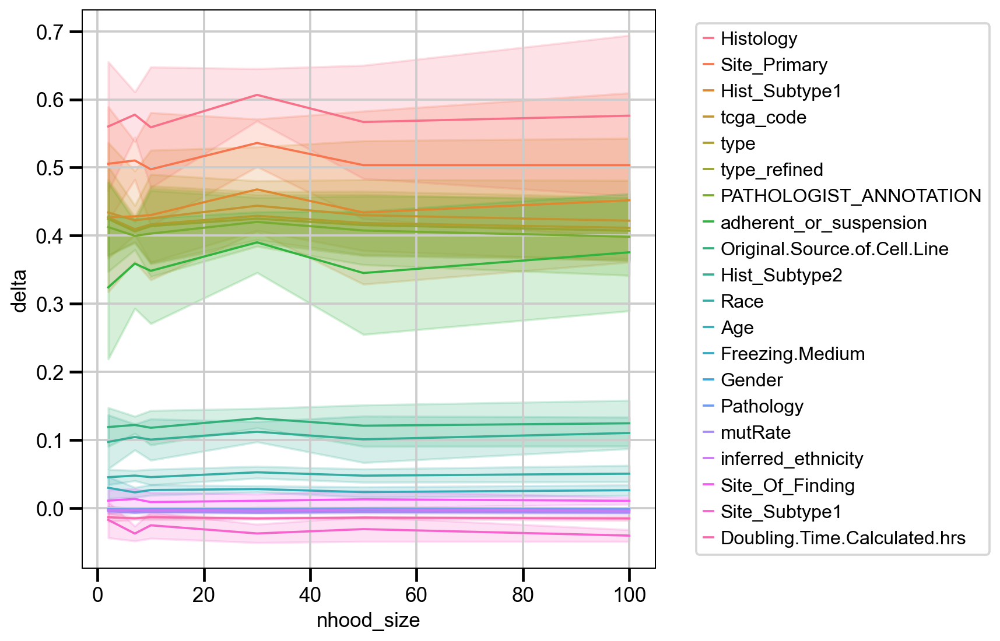

In [189]:
sb.lineplot(data=concated_PCR_values,x="nhood_size",y="delta",hue="column",errorbar="sd")
plt.legend(loc="right",bbox_to_anchor=(1.6,0.5))

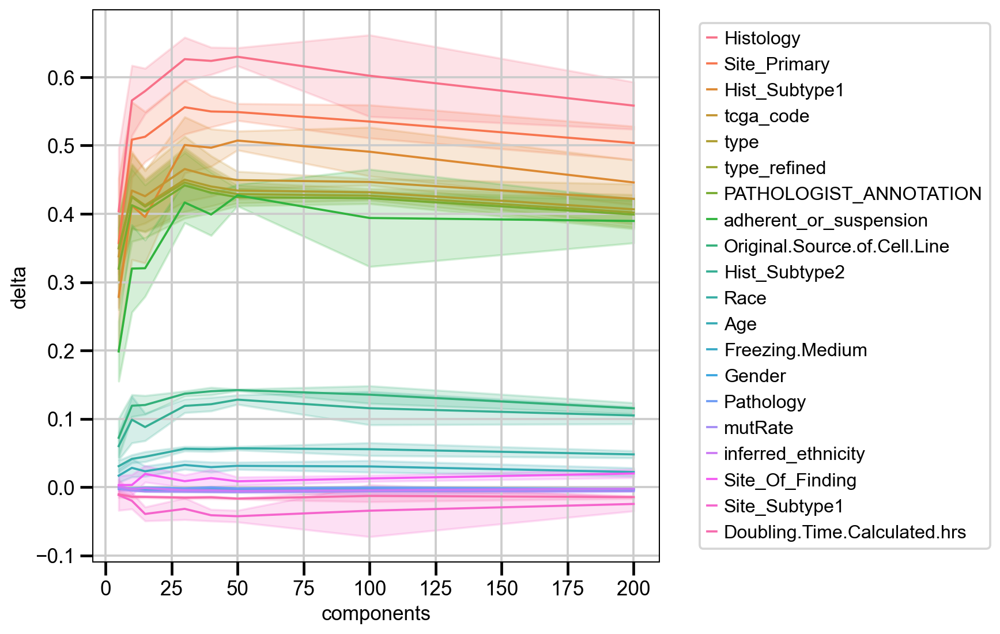

In [190]:
sb.lineplot(data=concated_PCR_values,x="components",y="delta",hue="column",errorbar="sd")
plt.legend(loc="right",bbox_to_anchor=(1.6,0.5))

(array([-10000.,      0.,  10000.,  20000.,  30000.,  40000.,  50000.]),
 [Text(-10000.0, 0, '−10000'),
  Text(0.0, 0, '0'),
  Text(10000.0, 0, '10000'),
  Text(20000.0, 0, '20000'),
  Text(30000.0, 0, '30000'),
  Text(40000.0, 0, '40000'),
  Text(50000.0, 0, '50000')])

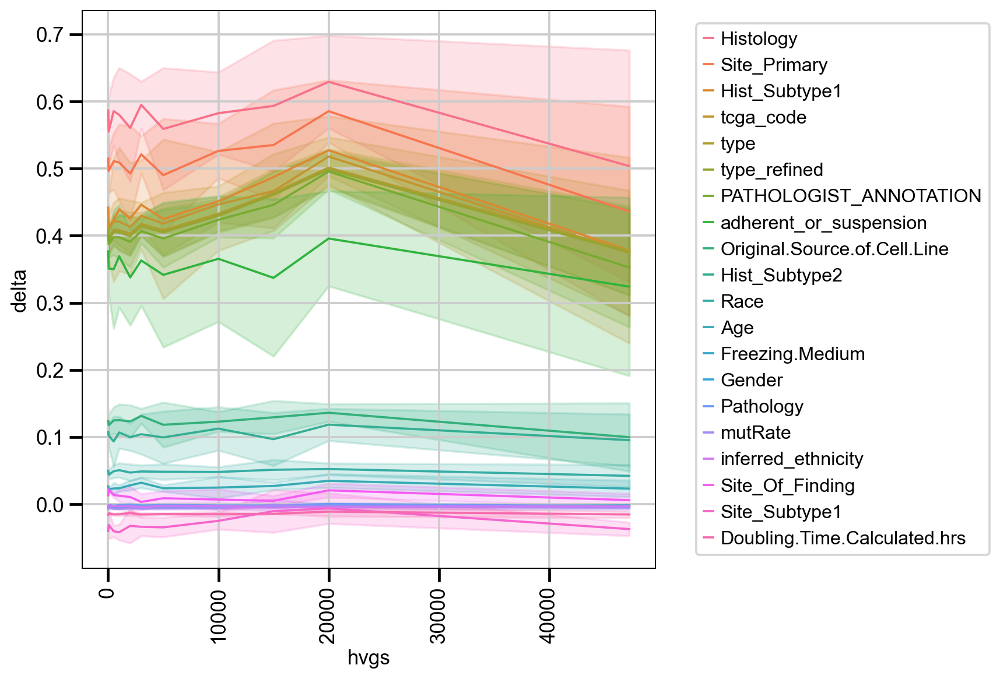

In [191]:
sb.lineplot(data=concated_PCR_values,x="hvgs",y="delta",hue="column",errorbar="sd")
plt.legend(loc="right",bbox_to_anchor=(1.6,0.5))
plt.xticks(rotation=90)

In [198]:
## load data from previous notebook
val_all = pd.read_csv("all_values_pcr.csv")

In [201]:
val_all

,Unnamed: 0,column,pcr_high_dimensional,pcr_umap,%observations,delta,subset
0,3,Histology,0.3172,0.8693,99.8214,0.5521,full
1,1,Site_Primary,0.4154,0.9081,99.8214,0.4927,full
2,18,tcga_code,0.5391,0.9399,96.0714,0.4008,full
3,14,type,0.5430,0.9328,100.0000,0.3898,full
4,15,type_refined,0.5494,0.9385,100.0000,0.3891,full
5,16,PATHOLOGIST_ANNOTATION,0.5560,0.9350,99.1071,0.3791,full
6,4,Hist_Subtype1,0.4461,0.7433,99.8214,0.2972,full
7,19,adherent_or_suspension,0.1339,0.4120,70.7143,0.2781,full
8,11,Original.Source.of.Cell.Line,0.0807,0.1841,93.0357,0.1034,full
9,5,Hist_Subtype2,0.0783,0.1769,99.8214,0.0986,full


In [208]:
val_all["pcr"]= val_all["pcr_high_dimensional"]

In [202]:
concated_PCR_values["subset"]="umap"

In [209]:
concated_PCR_values

,column,Unnamed: 0,pcr_high_dimensional,pcr_umap,%observations,delta,hvgs,components,nhood_size,subset
0,Histology,3,0.2983,0.8921,99.8214,0.5938,10000,10,10,umap
1,Site_Primary,1,0.3901,0.9266,99.8214,0.5365,10000,10,10,umap
2,Hist_Subtype1,4,0.4246,0.8798,99.8214,0.4551,10000,10,10,umap
3,tcga_code,18,0.5066,0.9588,96.0714,0.4521,10000,10,10,umap
4,type,14,0.5126,0.9507,100.0000,0.4381,10000,10,10,umap
...,...,...,...,...,...,...,...,...,...,...
1415,inferred_ethnicity,9,0.0083,0.0051,99.4643,-0.0032,47269,5,2,umap
1416,Pathology,0,0.0076,0.0008,99.8214,-0.0068,47269,5,2,umap
1417,Site_Of_Finding,10,0.1767,0.1694,32.1429,-0.0073,47269,5,2,umap
1418,Doubling.Time.Calculated.hrs,13,0.0187,0.0007,63.0357,-0.0181,47269,5,2,umap


In [210]:
concated_PCR_values["pcr"]=concated_PCR_values["pcr_umap"]

In [211]:
all_values = pd.concat([concated_PCR_values,val_all])

In [220]:
order = val_all[val_all.subset=="full"].sort_values("pcr_high_dimensional",ascending=False)["column"]

In [222]:
sc.set_figure_params(figsize=(16,7),dpi=90)

In [231]:
legend_mapping= {"full":"no reduction",
                "original geneset":"knowledge-driven reduction",
                "umap":"UMAP reduction"}

In [233]:
all_values["Reduction mode"]=all_values["subset"].map(legend_mapping)

In [241]:
color_mapping= {"no reduction":sb.color_palette("tab10")[4],
                "knowledge-driven reduction":sb.color_palette("dark")[4],
                "UMAP reduction":sb.color_palette("pastel")[4]}

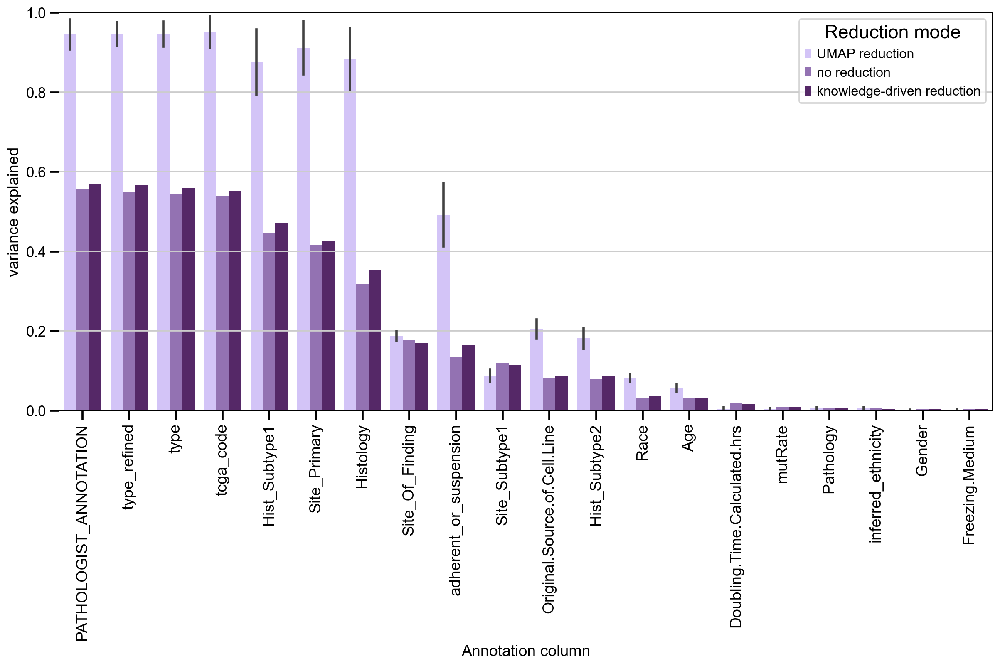

In [243]:
sb.barplot(all_values,x="column",y="pcr",hue="Reduction mode",order=order,palette=color_mapping,errorbar="sd")
plt.xticks(rotation=90,fontsize=15)
plt.ylabel("variance explained",fontsize=15)
plt.xlabel("Annotation column",fontsize=15)
#plt.title("Principal Component Regression: counts vs. UMAP",fontsize=20)
plt.ylim(0,1)
plt.show()